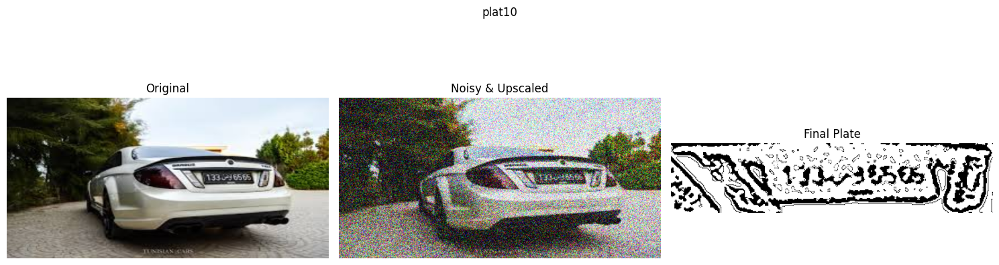

OCR result on original image: 


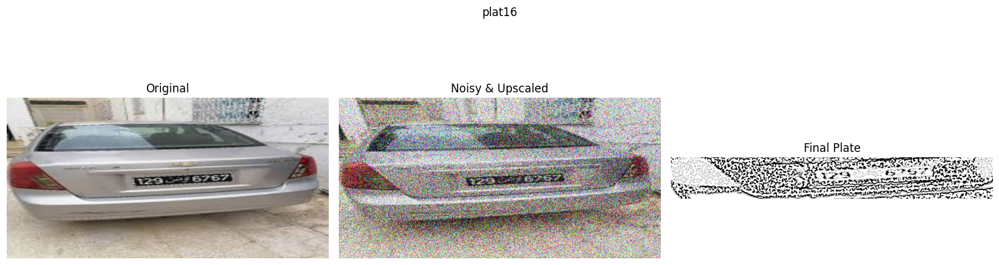

OCR result on original image: 3


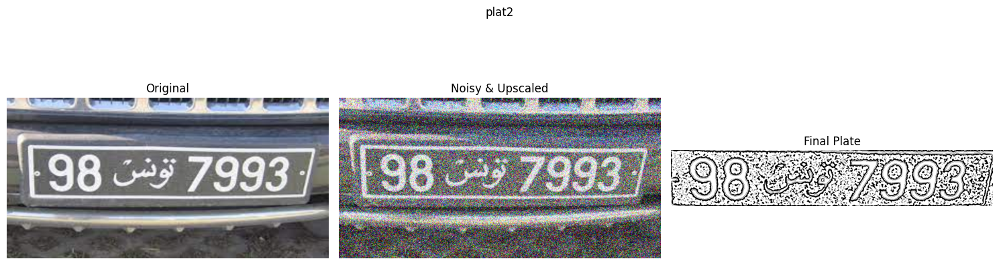

OCR result on original image: 279


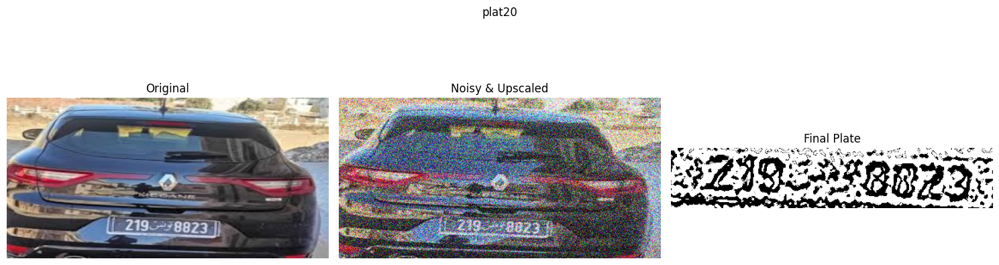

OCR result on original image: 3


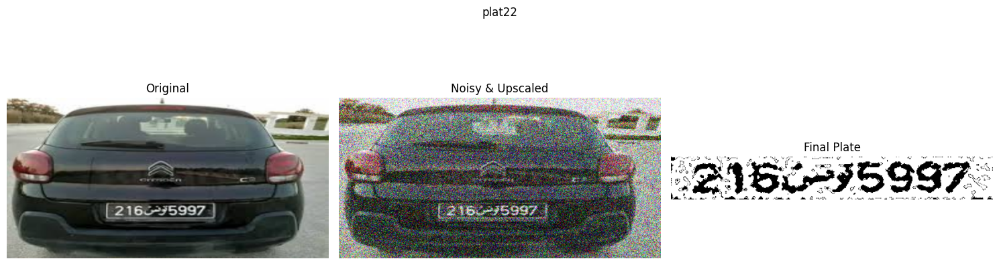

OCR result on original image: 6295997


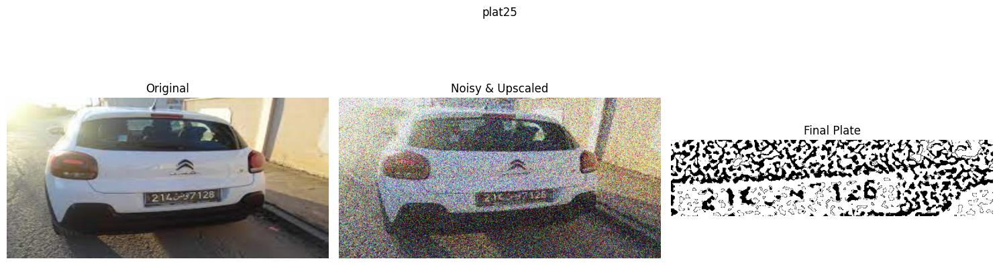

OCR result on original image: 


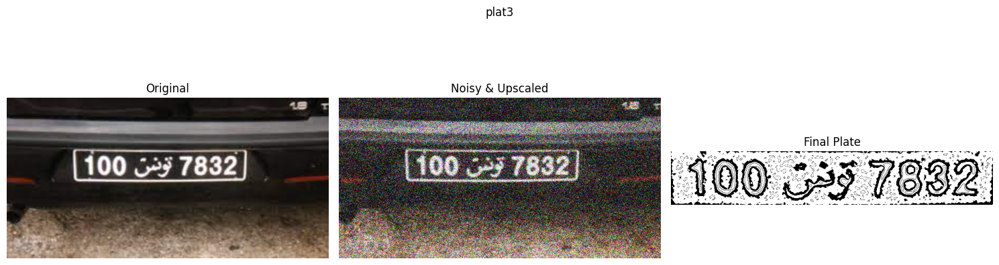

OCR result on original image: 1004378382


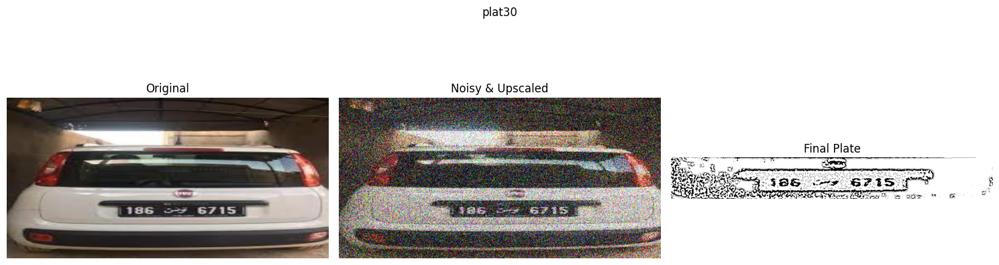

OCR result on original image: 71 6


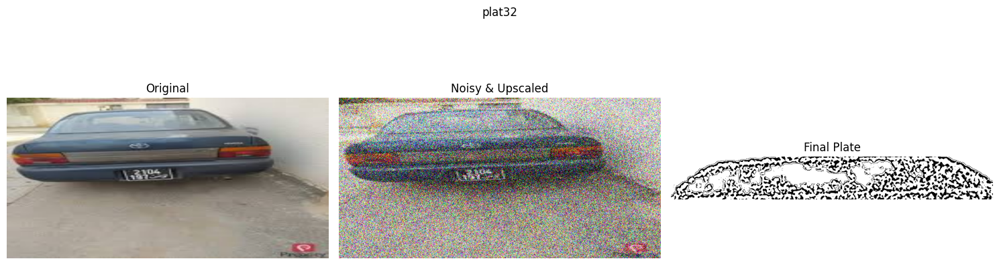

OCR result on original image: 
Plate not detected in Plates\plat33.jfif


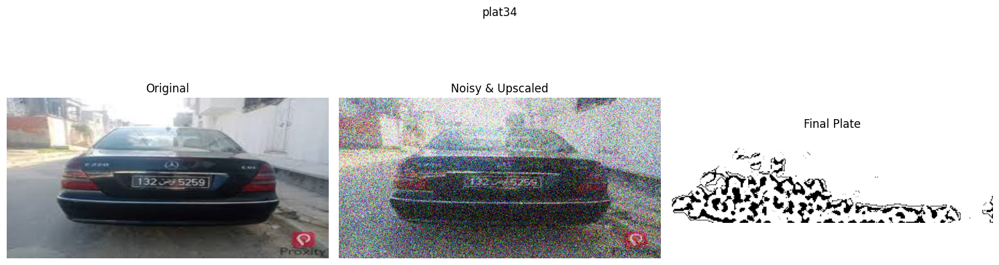

OCR result on original image: 


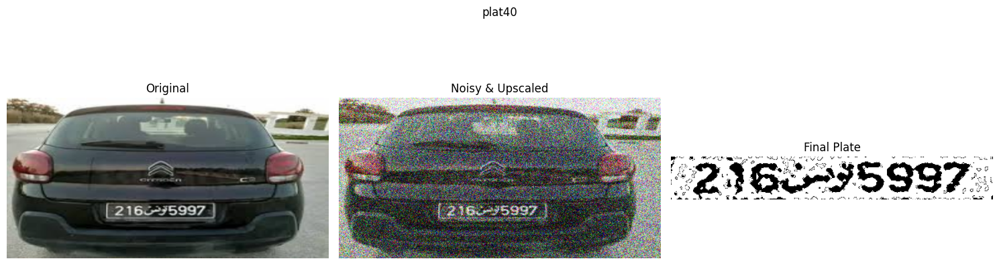

OCR result on original image: 2395997


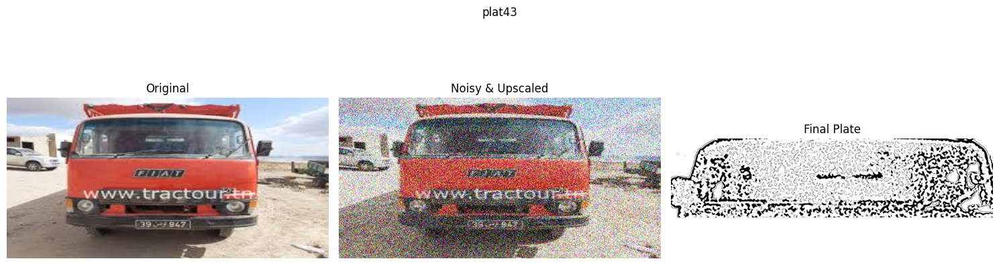

OCR result on original image: 


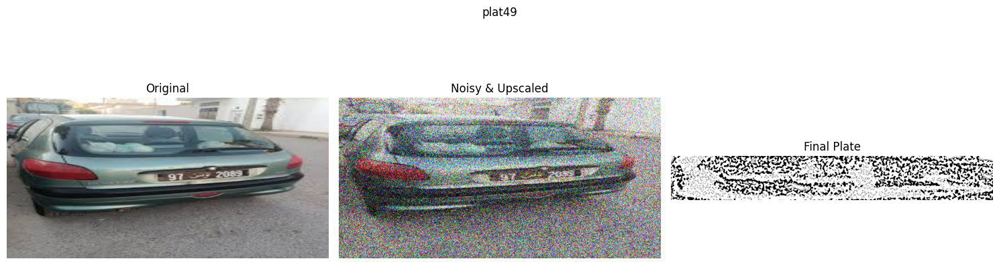

OCR result on original image: 


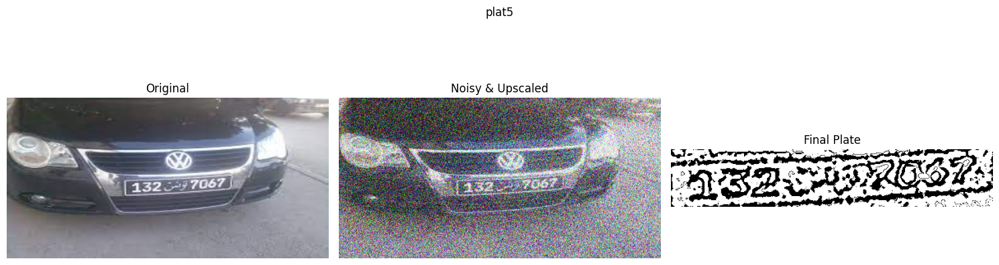

OCR result on original image: 


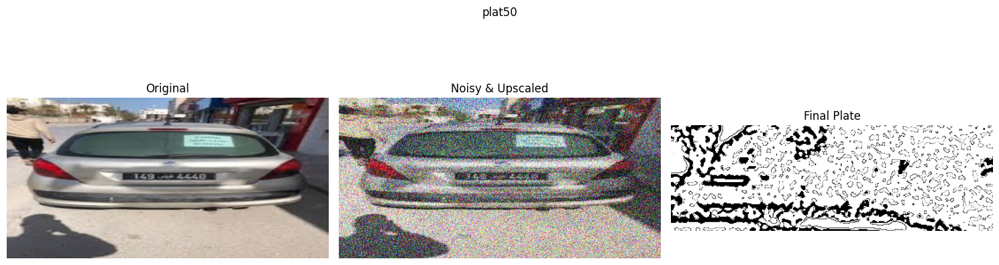

OCR result on original image: 


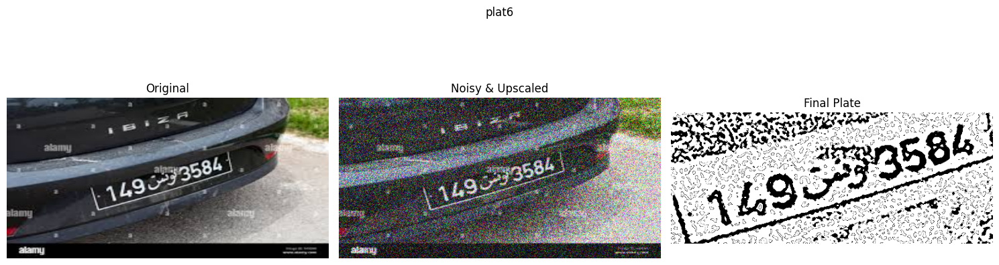

OCR result on original image: 


In [ ]:
import cv2
import numpy as np
import glob
import os
import matplotlib.pyplot as plt
c
input_folder = "Plates"
output_folder = "ProcessedPlates"
os.makedirs(output_folder, exist_ok=True)

image_paths = glob.glob(os.path.join(input_folder, "*.jfif")) + \
              glob.glob(os.path.join(input_folder, "*.jpg")) + \
              glob.glob(os.path.join(input_folder, "*.png"))

for image_path in image_paths:
    img = cv2.imread(image_path)
    if img is None:
        print(f"Image not found: {image_path}")
        continue
    img = cv2.resize(img, (600, 300))

    # Détection de la plaque sur l'image originale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    thresh = cv2.adaptiveThreshold(
        gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
        cv2.THRESH_BINARY_INV, 15, 10
    )
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    plate_bbox = None
    for cnt in sorted(contours, key=cv2.contourArea, reverse=True):
        x, y, w, h = cv2.boundingRect(cnt)
        if 2 < w / h < 8 and w > 80 and 25 < h < 120:
            plate_bbox = (x, y, w, h)
            break
    if plate_bbox is None:
        print(f"Plate not detected in {image_path}")
        continue
    x, y, w, h = plate_bbox

    # Pipeline de traitement
    img_noisy = add_gaussian_noise(img, mean=0, sigma=75)
    img_scaled = cv2.resize(img_noisy, (img_noisy.shape[1]*2, img_noisy.shape[0]*2), interpolation=cv2.INTER_CUBIC)
    gray2 = cv2.cvtColor(img_scaled, cv2.COLOR_BGR2GRAY)
    denoised_image_gauss = denoise_gaussian(gray2)
    denoise_image_median = denoise_median(gray2)
    denoised_image_bilateral = denoise_bilateral(gray2)
    combined_denoised = (
        1.75*denoised_image_gauss.astype(np.float32) +
        1.75*denoise_image_median.astype(np.float32) +
        denoised_image_bilateral.astype(np.float32)
    ) / 3.0
    combined_denoised = np.clip(combined_denoised, 0, 255).astype(np.uint8)
    combined_denoised = cv2.bitwise_not(combined_denoised)
    thresh_otsu_image = thresh_otsu(combined_denoised)
    thresh_adapt_mean_image = thresh_adapt_mean(combined_denoised)
    thresh_adapt_gauss_image = thresh_adapt_gauss(combined_denoised)
    combined_threshold = (
        1.25*thresh_otsu_image.astype(np.float32) +
        1.75*thresh_adapt_mean_image.astype(np.float32) +
        thresh_adapt_gauss_image.astype(np.float32)
    ) / 3.0
    combined_threshold = np.clip(combined_threshold, 0, 255).astype(np.uint8)
    hist_eq = cv2.equalizeHist(combined_threshold)
    combined_threshold = sharpen(combined_threshold)

    # Adapter les coordonnées (image doublée)
    x2, y2, w2, h2 = x*2, y*2, w*2, h*2

    # Extraire la plaque finale
    plate_final = combined_threshold[y2:y2+h2, x2:x2+w2]

    # Sauvegarder les images
    base_name = os.path.splitext(os.path.basename(image_path))[0]
    cv2.imwrite(os.path.join(output_folder, f"{base_name}_original.png"), img)
    cv2.imwrite(os.path.join(output_folder, f"{base_name}_noisy.png"), img_scaled)
    cv2.imwrite(os.path.join(output_folder, f"{base_name}_plate.png"), plate_final)

    # Affichage des trois images côte à côte
    plt.figure(figsize=(15, 5))
    plt.subplot(1, 3, 1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title("Original")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(cv2.cvtColor(img_scaled, cv2.COLOR_BGR2RGB))
    plt.title("Noisy & Upscaled")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(plate_final, cmap='gray')
    plt.title("Final Plate")
    plt.axis('off')

    plt.suptitle(base_name)
    plt.tight_layout()
    plt.show()
    ## ocr for final plate
    import pytesseract
    pytesseract.pytesseract.tesseract_cmd = r'C:\Program Files\Tesseract-OCR\tesseract.exe'
    ocr_result = pytesseract.image_to_string(plate_final, config='--psm 7 -c tessedit_char_whitelist=0123456789')
    print("OCR result on original image:", ocr_result.strip())
 